# **Graphing a politician facebook network.**

Data obtained from:  https://github.com/benedekrozemberczki/GEMSEC/tree/master/data

Code example from https://networkx.org/nx-guides/content/exploratory_notebooks/facebook_notebook.html using the above data

In [ ]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib
import matplotlib.pyplot as plt
from random import randint

#import the data
csv_url = 'https://raw.githubusercontent.com/benedekrozemberczki/GEMSEC/master/data/politician_edges.csv'
politician = pd.read_csv(csv_url, error_bad_lines=False)

#from google.colab import files
  
#uploaded = files.upload()



<ipython-input-15-7ba163682102>:10: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  politician = pd.read_csv(csv_url, error_bad_lines=False)


In [ ]:
#view the data

print(politician.iloc[:9])
G = nx.from_pandas_edgelist(politician, "node_1", "node_2")

   node_1  node_2
0       0    1972
1       0    5111
2       0     138
3       0    3053
4       0    1473
5       0    4978
6       0    4523
7       0    2334
8       0    1038


In [ ]:
politician.dtypes

node_1    int64
node_2    int64
dtype: object

In [ ]:
#check for null

politician.isnull().values.any()

False

In [ ]:
#check for self loops
nx.number_of_selfloops(G)

23

In [ ]:
loop_edges=list(nx.selfloop_edges(G, keys=True))

In [ ]:
G.remove_edges_from(loop_edges)

In [ ]:
nx.number_of_selfloops(G)

0

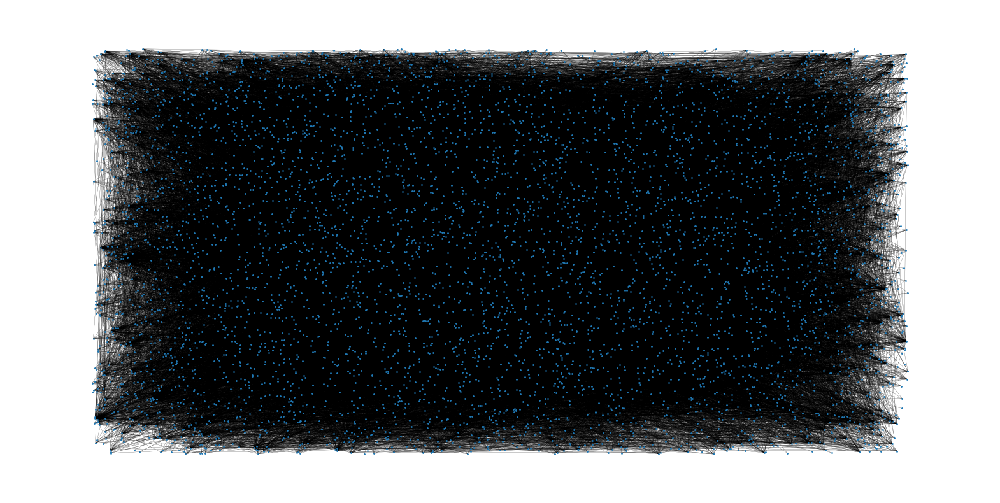

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))
ax.axis("off")
plot_options = {"node_size": 1, "with_labels": False, "width": 0.15}
nx.draw_networkx(G, pos=nx.random_layout(G), ax=ax, **plot_options)

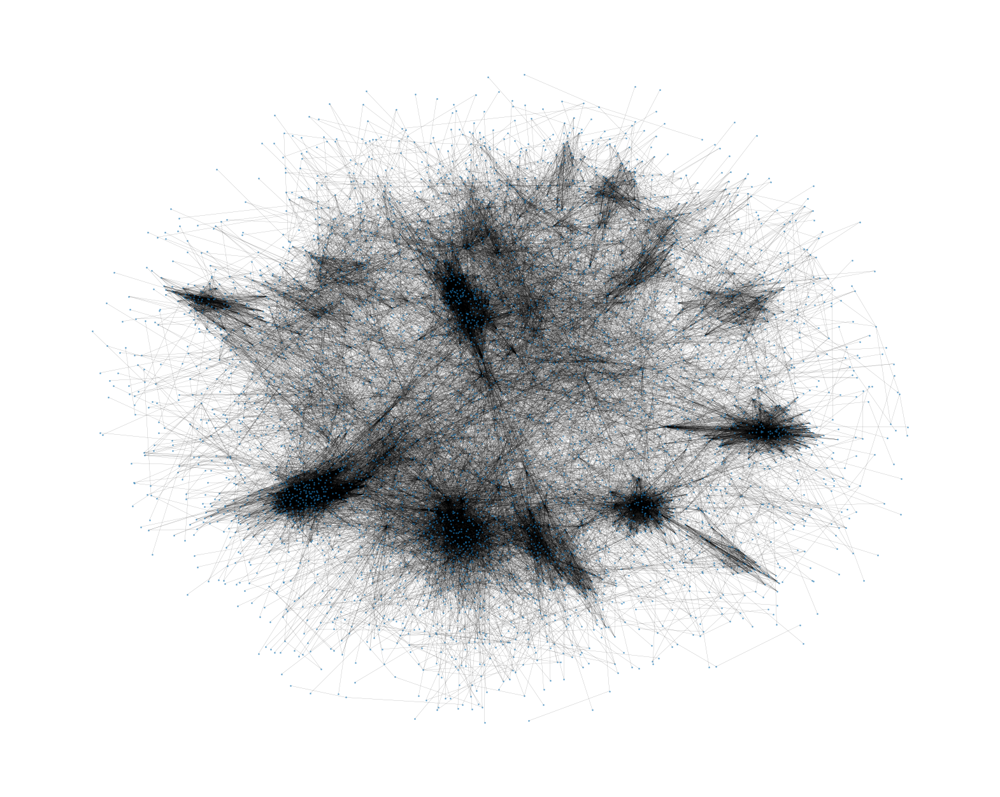

In [ ]:
pos = nx.spring_layout(G,  k = 0.1)
fig, ax = plt.subplots(figsize=(20, 16))
ax.axis("off")
nx.draw_networkx(G, pos=pos, ax=ax, alpha = 0.5, **plot_options)

In [ ]:
# number of nodes
G.number_of_nodes()

5908

In [ ]:
# number of edges
G.number_of_edges()

41706

In [ ]:
#average degree of a node
np.mean([d for _, d in G.degree()])
# in this case one node is connected on average to 14 other nodes

14.118483412322275

In [ ]:
shortest_path_lengths = dict(nx.all_pairs_shortest_path_length(G))

In [ ]:
#How many nodes to traverse from one node to another (maximum)
diameter = max(nx.eccentricity(G, sp=shortest_path_lengths).values())
diameter

14

In [ ]:
# Compute the average shortest path length for each node:  average shortest path between two nodes
average_path_lengths = [np.mean(list(spl.values())) for spl in shortest_path_lengths.values()]
# The average over all nodes
np.mean(average_path_lengths)

4.663317505749408

Text(0, 0.5, 'Frequency (%)')

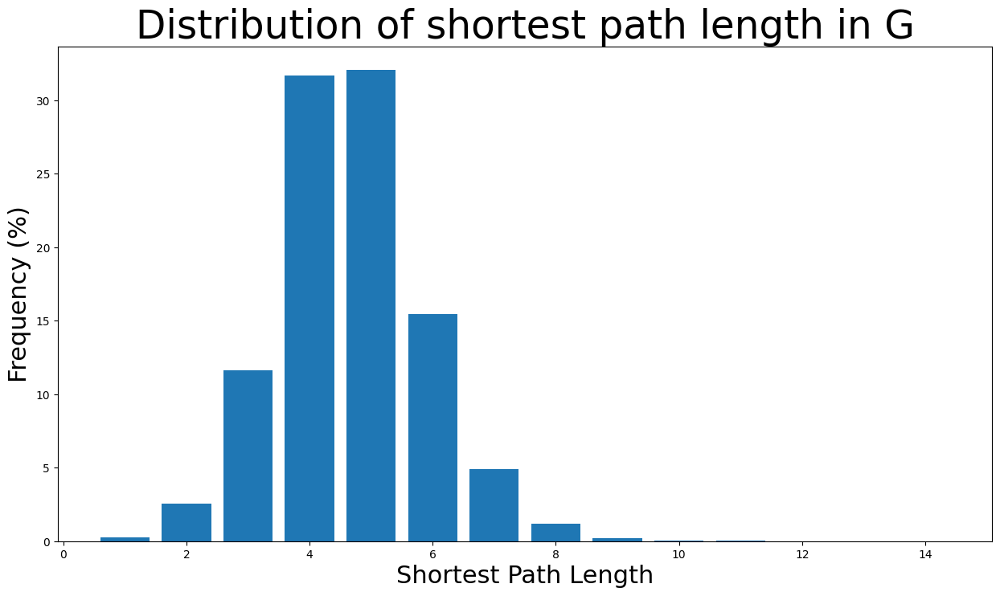

In [ ]:
# We know the maximum shortest path length (the diameter), so create an array
# to store values from 0 up to (and including) diameter
path_lengths = np.zeros(diameter + 1, dtype=int)

# Extract the frequency of shortest path lengths between two nodes
for pls in shortest_path_lengths.values():
    pl, cnts = np.unique(list(pls.values()), return_counts=True)
    path_lengths[pl] += cnts

# Express frequency distribution as a percentage (ignoring path lengths of 0)
freq_percent = 100 * path_lengths[1:] / path_lengths[1:].sum()

# Plot the frequency distribution (ignoring path lengths of 0) as a percentage
fig, ax = plt.subplots(figsize=(15, 8))
ax.bar(np.arange(1, diameter + 1), height=freq_percent)
ax.set_title(
    "Distribution of shortest path length in G", fontdict={"size": 35}, loc="center"
)
ax.set_xlabel("Shortest Path Length", fontdict={"size": 22})
ax.set_ylabel("Frequency (%)", fontdict={"size": 22})

In [ ]:
#density of less than one indicates sparse graph.  Expected in real world/small world graphs
nx.density(G) 



0.002390127545678394

In [ ]:
#How many components to the graph
nx.number_connected_components(G)

1

In [ ]:
#find the 10 nodes with the greatest centrality
degree_centrality = nx.centrality.degree_centrality(G)  # save results in a variable to use again
(sorted(degree_centrality.items(), key=lambda item: item[1], reverse=True))[:10]



[(1864, 0.05468088708312172),
 (4874, 0.04232266802099204),
 (5800, 0.03944472659556458),
 (5416, 0.038767563907228714),
 (1595, 0.037582529202640935),
 (4602, 0.037243947858473),
 (3576, 0.03504316912138141),
 (1474, 0.03267309971220586),
 (4032, 0.03064161164719824),
 (4972, 0.029287286270526496)]

In [ ]:
(sorted(degree_centrality.items(), key = lambda item:item[1], reverse=False))[:10]


[(6, 0.00016929067208396818),
 (8, 0.00016929067208396818),
 (9, 0.00016929067208396818),
 (10, 0.00016929067208396818),
 (13, 0.00016929067208396818),
 (1740, 0.00016929067208396818),
 (27, 0.00016929067208396818),
 (35, 0.00016929067208396818),
 (2597, 0.00016929067208396818),
 (4415, 0.00016929067208396818)]

In [ ]:
# Number of neighbors for these 10 highest centrality nodes
(sorted(G.degree, key=lambda item: item[1], reverse=True))[:10]

[(1864, 323),
 (4874, 250),
 (5800, 233),
 (5416, 229),
 (1595, 222),
 (4602, 220),
 (3576, 207),
 (1474, 193),
 (4032, 181),
 (4972, 173)]

Text(0, 0.5, 'Counts')

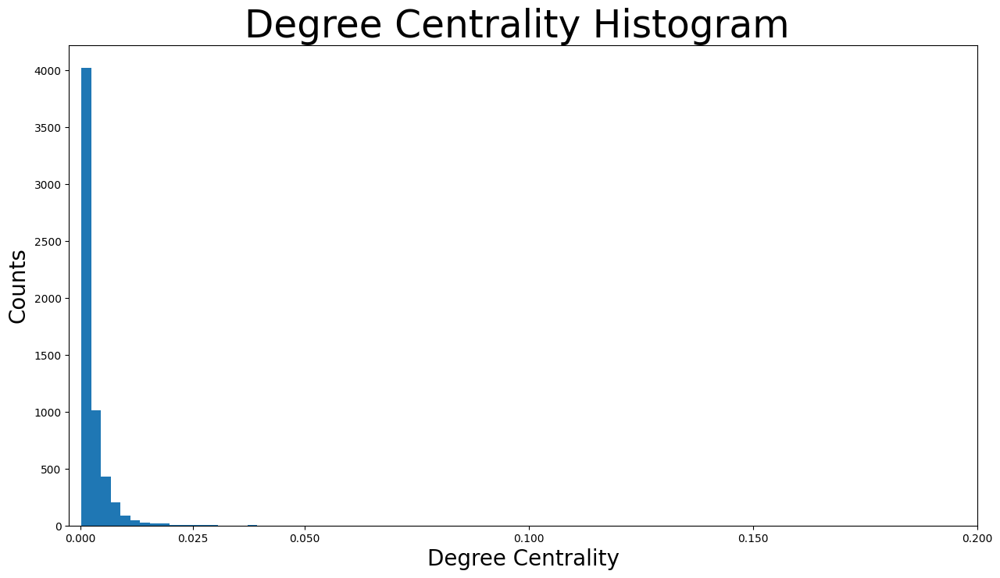

In [ ]:
#Plot degree centrality of all nodes
plt.figure(figsize=(15, 8))
plt.hist(degree_centrality.values(), bins=25)
plt.xticks(ticks=[0, 0.025, 0.05, 0.1, 0.15, 0.2])  # set the x axis ticks
plt.title("Degree Centrality Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Degree Centrality", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})

(-1.1856498071551322,
 1.2076861807703971,
 -1.1946747753024103,
 1.2033785435557367)

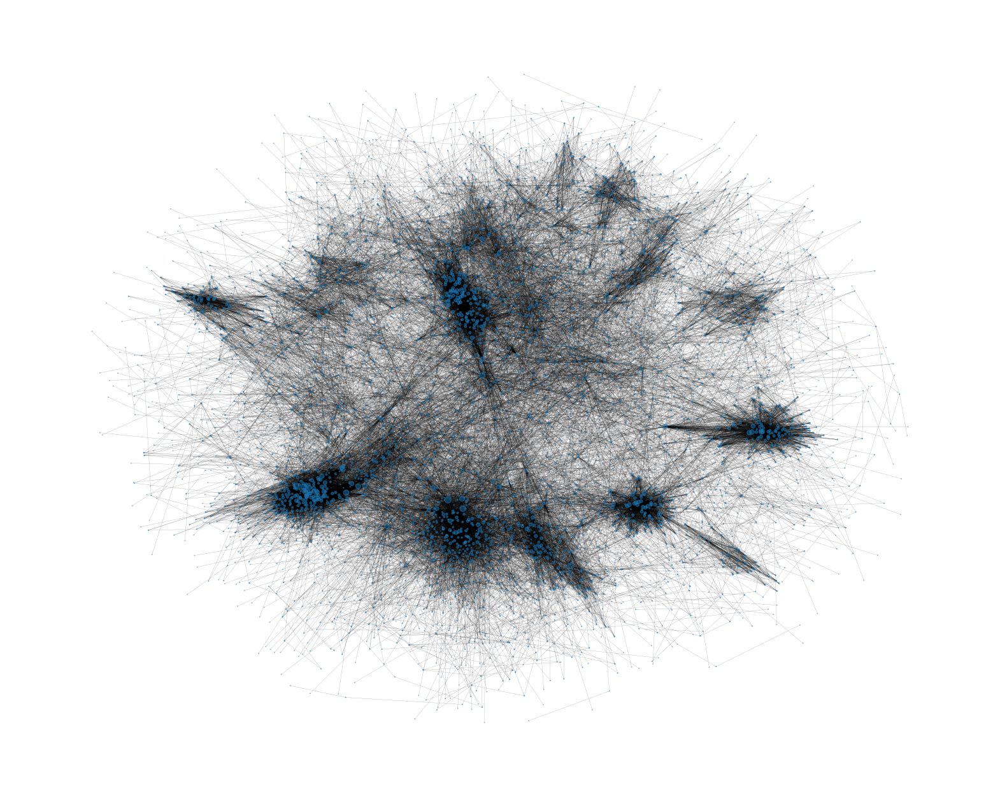

In [ ]:
#users with highest degree centralities from the size of their nodes:  I think this could be sharpened with a larger node size?
node_size = [v * 1000 for v in degree_centrality.values()]  # set up nodes size for a nice graph representation
plt.figure(figsize=(20, 16))
nx.draw_networkx(G, pos=pos, node_size=node_size, alpha=0.5, with_labels=False, width=0.15)
plt.axis("off")

In [ ]:
#These are 10 nodes that connect other nodes
betweenness_centrality = nx.centrality.betweenness_centrality(G)  # save results in a variable to use again  5800 has the highest

(sorted(betweenness_centrality.items(), key=lambda item: item[1], reverse=True))[:10]

[(5800, 0.26833769782232963),
 (1864, 0.055516710547232825),
 (3576, 0.054119477614629694),
 (2900, 0.04830356638479759),
 (1324, 0.04510631854551855),
 (3008, 0.03726160625260526),
 (1965, 0.035353462127597476),
 (4395, 0.03407402412149901),
 (191, 0.03178356809415848),
 (1836, 0.028978190316895823)]

(-1.1856498071551322,
 1.2076861807703971,
 -1.1946747753024103,
 1.2033785435557367)

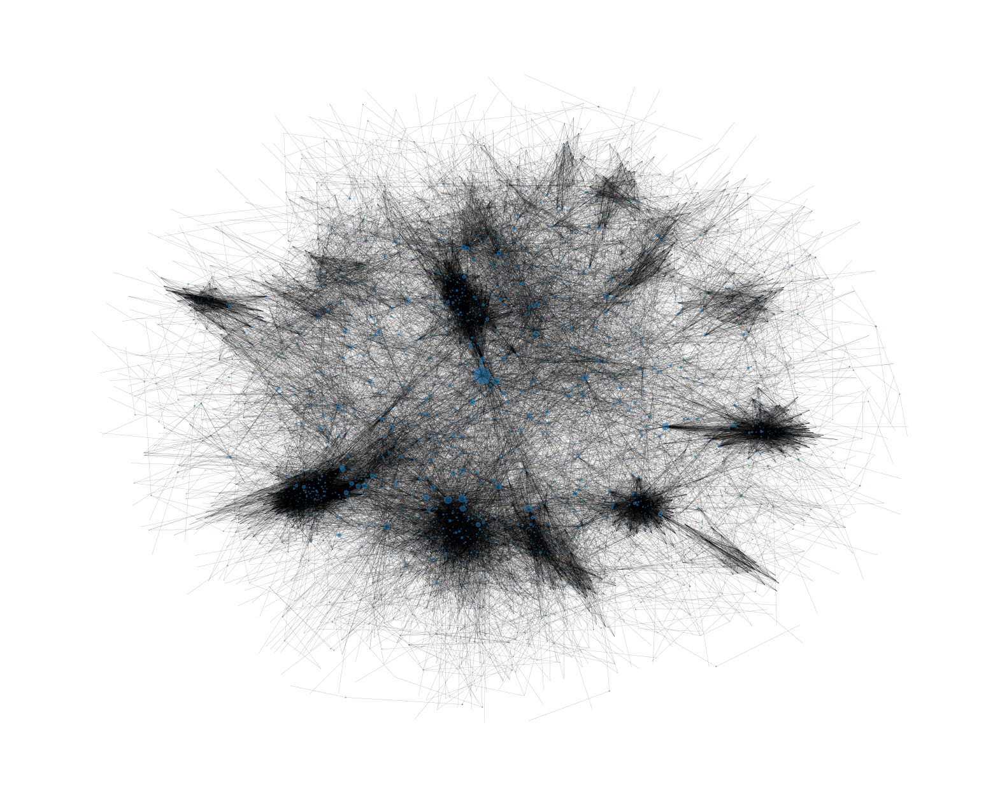

In [ ]:
#highest betweenness centralities and where they are located in the network.
node_size = [
    v * 1200 for v in betweenness_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(20, 16))
nx.draw_networkx(G, pos=pos,alpha = 0.5, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

In [ ]:
#Finding the ten nodes with the highest closeness centrality
closeness_centrality = nx.centrality.closeness_centrality(G)  
# save results in a variable to use again
(sorted(closeness_centrality.items(), key=lambda item: item[1], reverse=True))[:10]

[(5800, 0.35884818662292695),
 (4081, 0.3235116928637932),
 (2059, 0.32045787446427604),
 (4032, 0.31740999462654484),
 (3387, 0.31247355057130766),
 (3576, 0.3108292990949274),
 (1965, 0.3096885813148789),
 (4585, 0.3075281132861308),
 (2900, 0.3055555555555556),
 (4622, 0.3051451596239281)]

In [ ]:
#average distance of the node with the greatest closeness centrality to other nodes
print(1/ closeness_centrality[5800])

2.7866937531742


Text(0, 0.5, 'Counts')

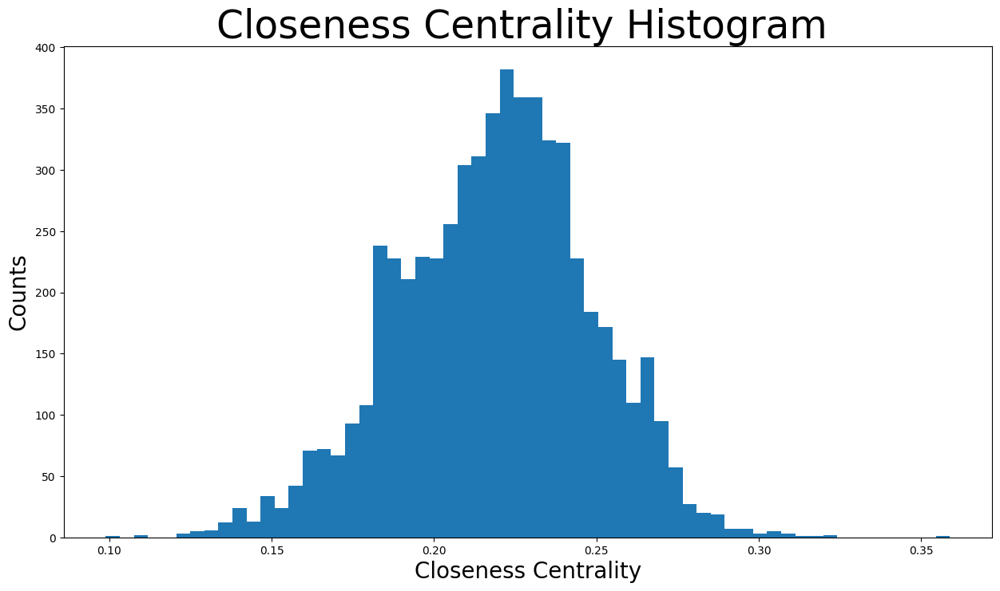

In [ ]:
#I think this indicates that most nodes are located toward the center of the network... need to work on understanding this.
plt.figure(figsize=(15, 8))
plt.hist(closeness_centrality.values(), bins=60)
plt.title("Closeness Centrality Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Closeness Centrality", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})

(-1.1856498071551322,
 1.2076861807703971,
 -1.1946747753024103,
 1.2033785435557367)

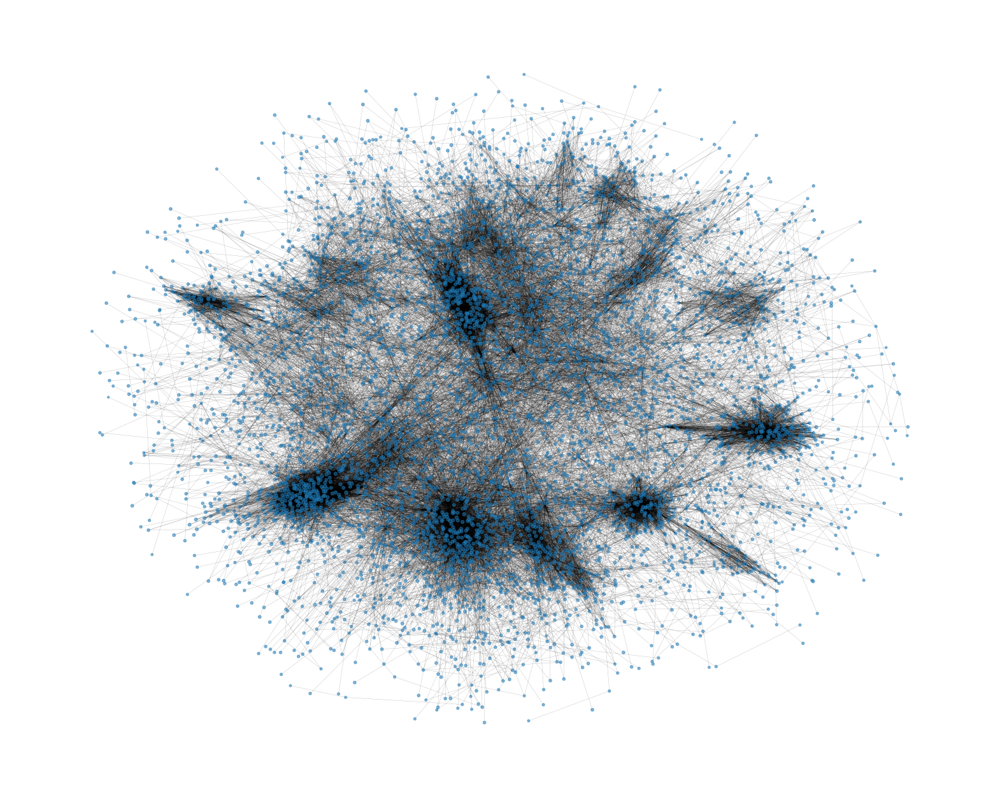

In [ ]:
#Need to look into what this is doing.  This is what the tutorial says for their dataset: there are some communities that are located further away, whose nodes would have the minimum closeness centralities, as seen below
#I think these closeness centralities are so similar that not very much info can be gleaned from this graph.
node_size = [v * 50 for v in closeness_centrality.values()]  

plt.figure(figsize=(20, 16))
nx.draw_networkx(G, pos=pos, node_size=node_size,alpha = 0.5, with_labels=False, width=0.15)
plt.axis("off")

In [ ]:
#Eigenvector centrality identifies the nodes with the most influence in the network
eigenvector_centrality = nx.centrality.eigenvector_centrality(G)  
# save results in a variable to use again
(sorted(eigenvector_centrality.items(), key=lambda item: item[1], reverse=True))[:10]
#node 5416, 1595, 4602,  is also a high centrality node

[(5416, 0.17409956097616527),
 (1595, 0.16992874612116096),
 (4602, 0.16844156764353838),
 (4972, 0.16026550292627353),
 (1414, 0.15950505217447272),
 (5726, 0.14601370099831895),
 (2770, 0.14386300530396742),
 (726, 0.14223080286291756),
 (4032, 0.14221279578910226),
 (1651, 0.13864429299751457)]

In [ ]:
high_eigenvector_centralities = (sorted(eigenvector_centrality.items(), key=lambda item: item[1], reverse=True))[1:10]  
# 2nd to 10th nodes with heighest eigenvector centralities
high_eigenvector_nodes = [tuple[0] for tuple in high_eigenvector_centralities]  
# set list as [highest eigenvector centralities
neighbors_5416 = [n for n in G.neighbors(5416)]  
# list with all nodes connected to 5416
all(item in neighbors_5416 for item in high_eigenvector_nodes)  # check if items in list high_eigenvector_nodes exist in list neighbors_5416
#these nodes are not connected to 5416

False

Text(0, 0.5, 'Counts')

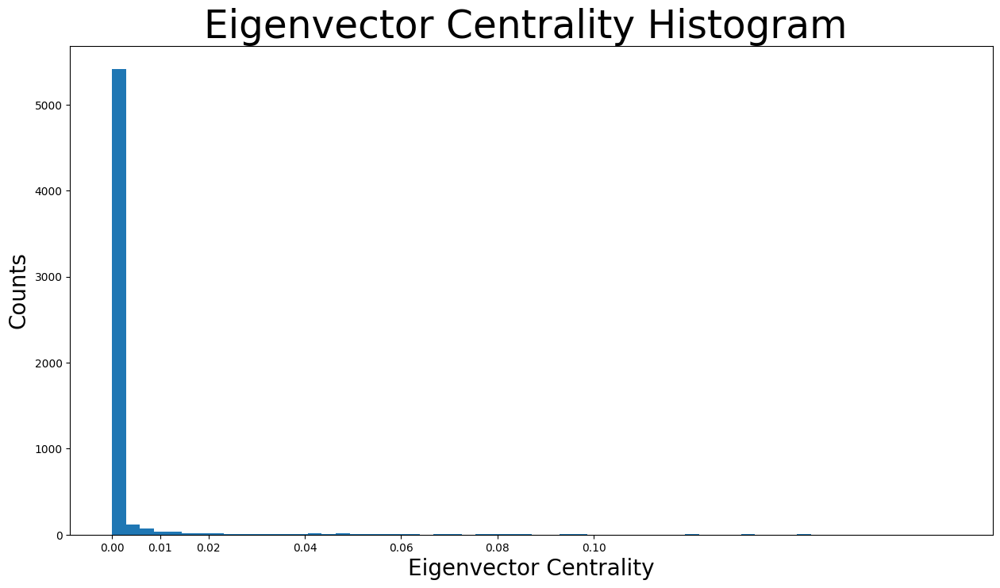

In [ ]:
plt.figure(figsize=(15, 8))
plt.hist(eigenvector_centrality.values(), bins=60)
plt.xticks(ticks=[0, 0.01, 0.02, 0.04, 0.06, 0.08, 0.10])  # set the x axis ticks
plt.title("Eigenvector Centrality Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Eigenvector Centrality", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})
#a few nodes have high centrality

(-1.1856498071551322,
 1.2076861807703971,
 -1.1946747753024103,
 1.2033785435557367)

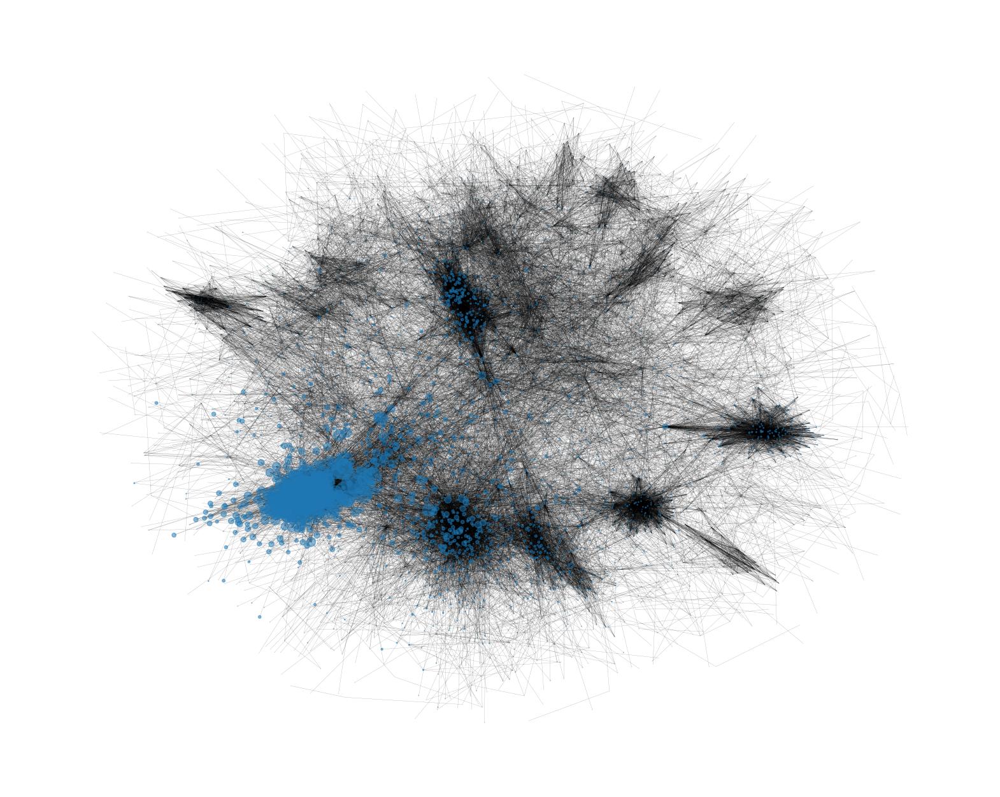

In [ ]:
node_size = [v * 4000 for v in eigenvector_centrality.values()]  # set up nodes size for a nice graph representation
plt.figure(figsize=(20, 16))
nx.draw_networkx(G, pos=pos, node_size=node_size,alpha = 0.5, with_labels=False, width=0.15)
plt.axis("off")
#more dense network than the one in the example

In [ ]:
#average clustering coefficient is the average of clustering coefficients of all the nodes.  Closer to one indicates one component.
#This indicates more than one component?
nx.average_clustering(G)

0.385096125793274

Text(0, 0.5, 'Counts')

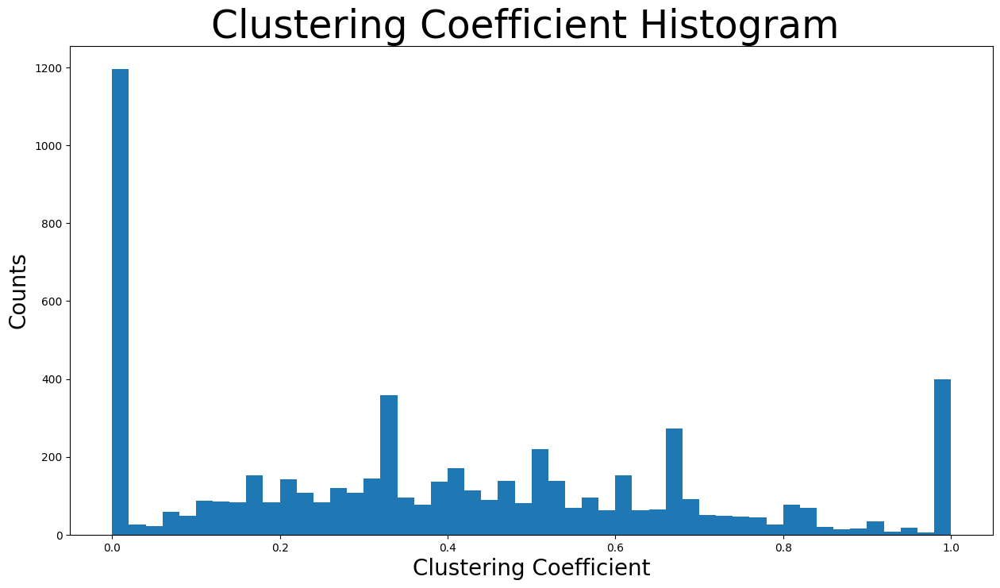

In [ ]:
#average clustering coefficient distribution
plt.figure(figsize=(15, 8))
plt.hist(nx.clustering(G).values(), bins=50)
plt.title("Clustering Coefficient Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Clustering Coefficient", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})
#this is very different from the example, with a more uniform distribution of clustering coefficients

In [ ]:
#Find the number of unique triangles
triangles_per_node = list(nx.triangles(G).values())
sum(triangles_per_node) / 3  # divide by 3 because each triangle is counted once for each node

174632.0

In [ ]:
#average number of triangles that a node belongs to, alot less than in the practice example.
np.mean(triangles_per_node)

88.67569397427218

In [ ]:
#majority of nodes of the network belong to extremely few triangles (much fewer than the example)
np.median(triangles_per_node)

8.0

In [ ]:
#Exploring bridges that connect components
nx.has_bridges(G)


True

In [ ]:
#Find number of bridges (there are alot)
bridges = list(nx.bridges(G))
len(bridges)

649

In [ ]:
#what are local bridges?  (there are a lot)
local_bridges = list(nx.local_bridges(G, with_span=False))
len(local_bridges)

3463

In [ ]:
#Exploring assortivity - preference for a network’s nodes to attach to others that are similar in some way
#this is much lower than the example  still close to zero, indicating that nodes only slightly
#attach to others that are similar
nx.degree_assortativity_coefficient(G)


0.018203251192230974

In [ ]:
import networkx.algorithms.community as nxcom

communities = sorted(nxcom.greedy_modularity_communities(G), key=len, reverse=True)
len(communities)

36

Reference code: 
https://networkx.org/nx-guides/content/exploratory_notebooks/facebook_notebook.html 
https://graphsandnetworks.com/community-detection-using-networkx/